In [1]:
import os
import glob
import re

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools
from scipy.stats import norm

In [2]:
import seaborn as sns
method_dict ={
    "SobolSampling": "dimgray",
    "BernoulliMCMutualInformation": sns.color_palette("tab10")[4],
    "MOCU": sns.color_palette("tab10")[2],
    "CoreMSE": sns.color_palette("tab10")[0],
    "LogCoreMSE": sns.color_palette("dark")[0],
    "GlobalMI (multi level set)": sns.color_palette("tab10")[1],
    "LogGlobalMI (multi level set)": sns.color_palette("dark")[1],
}

In [3]:
data_dir = "data/benchmark_teacher/sota"
data_paths = sorted(glob.glob(os.path.join(data_dir, "**out.csv")))
df=[]
for data_path in data_paths:
    df.append(pd.read_csv(data_path, index_col=0))

In [17]:
d.method.unique()

array(['SobolSampling', 'CoreMSE', 'GlobalMI', 'LogCoreMSE',
       'LogGlobalMI'], dtype=object)

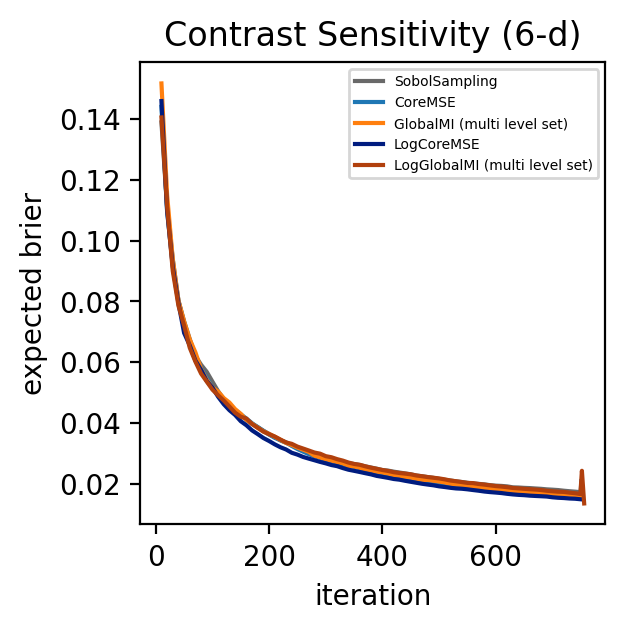

In [34]:
# yes/no question
title_dict={
            "discrim_lowdim": "Psych. Discrimination (2-d)",
            "discrim_highdim": "Psych. Discrimination (8-d)",
            "contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
            "hartmann6_binary": "Binarized Hartmann6 (6-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)",
           }
metric="expected_brier"
data["method"]=data.method.apply(lambda x: f"{x} (multi level set)" if x in ["GlobalMI", "LogGlobalMI"] else x)
problems=list(title_dict.keys())[:-1]
fig,ax=plt.subplots(1, 1, figsize=(3,3), dpi=200)

for i_method, method in enumerate(data.method.unique()):
    data_subset=data[(data.method==method)]
    # print(problem_name, method, len(data_subset.rep.unique()))
    data_subset=data_subset[["trial_id", metric]]
    n_runs=data_subset.groupby("trial_id").size().tolist()
    data_mean=data_subset.groupby("trial_id").mean().reset_index()
    data_std=data_subset.groupby("trial_id").std().reset_index()

    ci = data_std[metric] * 1.96 / np.sqrt(n_runs)
    ax.plot(data_mean.trial_id, data_mean[metric], label=method, color=method_dict[method])
    ax.set_xlabel(f"iteration")
    ax.set_title(title_dict["contrast_sensitivity_6d"])
    ax.set_ylabel(" ".join(metric.split("_")))
ax.legend(fontsize=5)

In [ ]:
# yes/no question
title_dict={
            "discrim_lowdim": "Psych. Discrimination (2-d)",
            "discrim_highdim": "Psych. Discrimination (8-d)",
            "contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
            "hartmann6_binary": "Binarized Hartmann6 (6-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)",
           }
metric="expected_brier"
data["method"]=data.method.apply(lambda x: f"{x} (multi level set)" if x in ["GlobalMI", "LogGlobalMI"] else x)
problems=list(title_dict.keys())[:-1]
methods=method_map.keys()
fig,ax=plt.subplots(1, 1, figsize=(4*len(problems), 6), dpi=200)

for i_problem, problem_name in enumerate(problems):
    for i_method, method in enumerate(methods):
        data_subset=data[(data.problem_name==problem_name) & (data.method==method)]
        if len(data_subset) == 0:
            continue
        if problem_name == "discrim_lowdim" or problem_name == "remote_haptics_2d":
            data_subset=data_subset[data_subset.trial_id <= 500]
        print(problem_name, method, len(data_subset.rep.unique()))
        data_subset=data_subset[["trial_id", metric]]
        n_runs=data_subset.groupby("trial_id").size().tolist()
        data_mean=data_subset.groupby("trial_id").mean().reset_index()
        data_std=data_subset.groupby("trial_id").std().reset_index()
        
        ci = data_std[metric] * 1.96 / np.sqrt(n_runs)
        if i_problem==0:
            ax[i_problem].plot(data_mean.trial_id, data_mean[metric], label=method, color=method_map[method])
        else:
            ax[i_problem].plot(data_mean.trial_id, data_mean[metric], color=method_map[method])
        # ax[i_problem].fill_between(data_mean.trial_id, data_mean[metric] - ci, data_mean[metric]+ci, alpha=0.3, color=method_map[method])
        ax[i_problem].set_xlabel(f"iteration")
        ax[i_problem].set_title(title_dict[problem_name])
        ax[i_problem].set_ylabel(metric)

### importance sampling shit

In [106]:
from aepsych.utils import make_scaled_sobol
import torch
from botorch.utils.probability.truncated_multivariate_normal import TruncatedMultivariateNormal

ub=torch.tensor([1., 0.5])
lb=torch.tensor([-0.5, -0.8])
Xstar=make_scaled_sobol(lb, ub, 100, seed=0)
loc=Xstar.reshape(-1)
cov=torch.tensor([0.1288, 0.0418]).diag()
bounds=torch.vstack([lb, ub]).T
# bounds=bounds.expand(Xstar.shape[0], *bounds.shape).reshape(-1,2)
# cov=cov.expand(Xstar.shape[0], *cov.shape)

In [104]:
torch.linalg.cholesky(cov)

tensor([[0.3589, 0.0000],
        [0.0000, 0.2045]])

In [107]:
Xq=[]
log_prob=[]
for x in Xstar:
    tmvn=TruncatedMultivariateNormal(loc=x, covariance_matrix=cov, bounds=bounds)
    samples=tmvn.rsample(torch.Size([256]))
    log_prob.append(tmvn.log_prob(samples))
    Xq.append(samples)

In [117]:
Xq=torch.stack(Xq)

In [114]:
log_prob=torch.stack(log_prob)

In [119]:
log_prob.shape

torch.Size([100, 256])

In [122]:
torch.where(log_prob==log_prob.min())

(tensor([28]), tensor([173]))

In [123]:
Xq[28,173]-Xstar[28]

tensor([ 0.8441, -0.7258])

In [99]:
from torch.distributions.multivariate_normal import MultivariateNormal
mvn=MultivariateNormal(loc=Xstar.reshape(-1), covariance_matrix=cov)

In [2]:
# mvn.log_prob(samples).exp()

In [55]:
samples_reshaped=samples.reshape(256,2,100)

### results

In [22]:
methods = {
    "benchmark_log_normal_ls_unit_variance": ["baseline", "novel_acqf", "globalmi_multi", 
                                              "log_globalmi_and_bemps", "mocu_bald", "log_coremse", "mocu"],
    # "benchmark": ["sobol", "baseline"], # , "posterior_predictive"
    # "benchmark_log_normal_ls": ["baseline", "novel_acqf"],
    # "benchmark_log_normal_ls_unit_variance": ["baseline", "novel_acqf"]
    # "pairwise_benchmark": ["levelset_lognormal_prior", "levelset"],
    # "benchmark_log_normal_ls_unit_variance": ["log_lse_baseline", "log_lse_soft", "log_lse_entropy_reduction", "log_lse_sur", "log_lse_soft_globalmi"]
}
acqfs = ["GlobalMI", 'BernoulliMCMutualInformation', np.nan]
data=[]
problems=["discrim_highdim", "contrast_sensitivity_6d", "hartmann6_binary", "remote_haptics_2d", "discrim_lowdim"]
for method in methods.keys():
    if "pairwise" not in method:
        prior = "log_normal" if "log_normal" in method else "gamma"
        lengthscale = "fixed" if "unit_variance" in method else "scaled"
    for acqf in methods[method]:
        if "pairwise" in method: 
            prior="log_normal" if "lognormal" in acqf else "gamma"
            lengthscale="fixed" if "lognormal" in acqf else "scaled"
        print(acqf,prior)
        data_root=os.path.join("data", method, acqf)
        data_paths=glob.glob(os.path.join(data_root,"*out.csv"))
        if acqf == "log_lse_entropy_reduction":
            data_paths = [path for path in data_paths if int(re.findall(r"chunk(\d+)", path)[0]) >= 3]

        threshold=None
        for data_path in data_paths:
            try:
                threshold=float(re.findall(r"\d.\d+", data_path)[0])
            except:
                pass
            df = pd.read_csv(data_path, index_col=0)
            if threshold is not None:
                df["threshold"]=[threshold]*len(df)
            # df = df[df.problem_name.isin(problems)]
            if "posterior_predictive" in acqf:
                df = df[df.OptimizeAcqfGenerator_acqf.isin(["SMOCU", "MOCU"])]
            if acqf == "baseline" and method == "benchmark":
                df = df[df.OptimizeAcqfGenerator_acqf!="MCPosteriorVariance"]
            if "multi_levelset" in acqf and method == "benchmark":
                df = df[df.OptimizeAcqfGenerator_acqf.isin(["GlobalMI"])]
            if method == "pairwise_benchmark" and "levelset" in acqf:
                df = df[df.OptimizeAcqfGenerator_acqf.isin(["GlobalMI", "LogGlobalSUR", "BernoulliMCMutualInformation", "none", "MOCU"])]
            if acqf in ["log_lse_sur", "log_lse_entropy_reduction"]:
                df = df[df.OptimizeAcqfGenerator_acqf.isin(["GlobalMI", "GlobalSUR"])]
            if acqf in ["log_lse_soft"]:
                df = df[df.OptimizeAcqfGenerator_acqf.isin(["LogGlobalSUR", "GlobalSUR"])]
            df["prior"]=len(df)*[prior]
            df["lengthscale"]=len(df)*[lengthscale]
            data.append(df)
data=pd.concat(data).reset_index()
final_idx=[0]+(np.where(data[["final"]]==True)[0]+1).tolist()
print((data[["final"]]==True).sum())
data_idx=[[i]*(n) for i,n in enumerate(np.diff(final_idx))]
data_idx=list(itertools.chain(*data_idx))
data["rep"]=data_idx
data=data[(data.trial_id<=740)]
data=data[data.trial_id%10 ==0]

baseline log_normal
novel_acqf log_normal
globalmi_multi log_normal
log_globalmi_and_bemps log_normal
mocu_bald log_normal
log_coremse log_normal
mocu log_normal
final    9763
dtype: int64


In [23]:
def method_map(x, columns):
    # different lookahead types
    generator=x.opt_strat_generator
    if generator == 'SobolGenerator':
        return f"SobolSampling"
    x_acqf=x[f"{generator}_acqf"]
    if f"{x_acqf}_lookahead_type" in columns and x[f"{x_acqf}_lookahead_type"] != "posterior":
        # lookahead_type=" ".join(x[f'{x_acqf}_lookahead_type'].split("_"))
        sampling=f"{x_acqf}_sampling_method"
        
        if x[sampling] == 'importance_sampling':
            return np.nan
    return f"{x_acqf}"
        
data["method"]=data.apply(lambda x: method_map(x, list(data.columns)), axis=1)
data=data[~data.method.isna()]

In [137]:
def convert_tensor_to_float(x):
    if isinstance(x, float) or len(re.findall(r"\d+.\d+", x)) == 0:
        return np.nan
    else:
        return float(re.findall(r"\d+.\d+", x)[0])

data["acqf_sum_mean"]=data["acqf_sum_mean"].apply(lambda x: convert_tensor_to_float(x))
data["acqf_sum_std"]=data["acqf_sum_std"].apply(lambda x: convert_tensor_to_float(x))

## Brier score

In [129]:
# fig,ax=plt.subplots(len(data.problem_name.unique()), 1, figsize=(5,10))
# for i, problem in enumerate(data.problem_name.unique()):
#     for j in range(3):
#         ax[i].hist(diffs[problem][j], alpha=0.5, bins=20)

In [25]:
import seaborn as sns
method_map ={
    "SobolSampling": "dimgray",
    "BernoulliMCMutualInformation": sns.color_palette("tab10")[4],
    "MOCU": sns.color_palette("tab10")[2],
    "CoreMSE": sns.color_palette("tab10")[0],
    "LogCoreMSE": sns.color_palette("dark")[0],
    "GlobalMI (multi level set)": sns.color_palette("tab10")[1],
    "LogGlobalMI (multi level set)": sns.color_palette("dark")[1],
}

In [28]:
list(set(list(title_dict.keys())) - set(['remote_haptics_2d']))

['hartmann6_binary',
 'discrim_highdim',
 'contrast_sensitivity_6d',
 'discrim_lowdim']

discrim_lowdim SobolSampling 280
discrim_lowdim BernoulliMCMutualInformation 267
discrim_lowdim MOCU 269
discrim_lowdim CoreMSE 300
discrim_lowdim LogCoreMSE 198
discrim_lowdim GlobalMI (multi level set) 240
discrim_lowdim LogGlobalMI (multi level set) 300
discrim_highdim SobolSampling 260
discrim_highdim BernoulliMCMutualInformation 300
discrim_highdim MOCU 300
discrim_highdim CoreMSE 280
discrim_highdim LogCoreMSE 220
discrim_highdim GlobalMI (multi level set) 240
discrim_highdim LogGlobalMI (multi level set) 280
contrast_sensitivity_6d SobolSampling 280
contrast_sensitivity_6d BernoulliMCMutualInformation 295
contrast_sensitivity_6d MOCU 289
contrast_sensitivity_6d CoreMSE 280
contrast_sensitivity_6d LogCoreMSE 240
contrast_sensitivity_6d GlobalMI (multi level set) 220
contrast_sensitivity_6d LogGlobalMI (multi level set) 280
hartmann6_binary SobolSampling 280
hartmann6_binary BernoulliMCMutualInformation 300
hartmann6_binary MOCU 300
hartmann6_binary CoreMSE 280
hartmann6_binary Lo

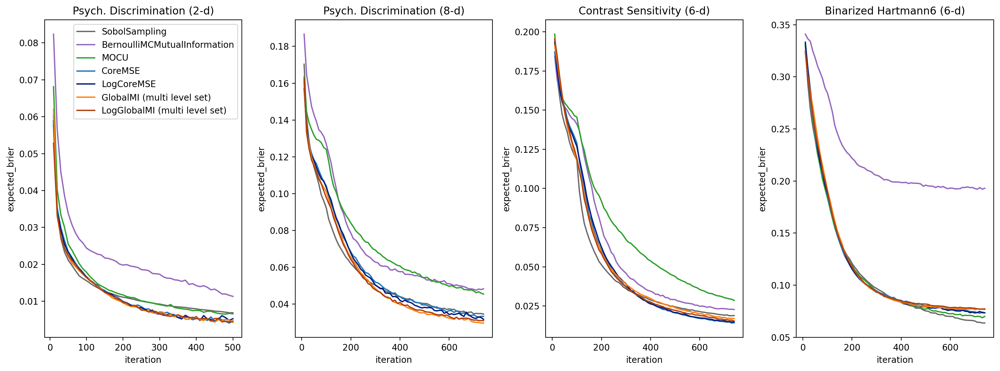

In [29]:
# yes/no question
title_dict={
            "discrim_lowdim": "Psych. Discrimination (2-d)",
            "discrim_highdim": "Psych. Discrimination (8-d)",
            "contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
            "hartmann6_binary": "Binarized Hartmann6 (6-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)",
           }
metric="expected_brier"
data["method"]=data.method.apply(lambda x: f"{x} (multi level set)" if x in ["GlobalMI", "LogGlobalMI"] else x)
problems=list(title_dict.keys())[:-1]
methods=method_map.keys()
fig,ax=plt.subplots(1, len(problems), figsize=(4*len(problems), 6), dpi=200)

for i_problem, problem_name in enumerate(problems):
    for i_method, method in enumerate(methods):
        data_subset=data[(data.problem_name==problem_name) & (data.method==method)]
        if len(data_subset) == 0:
            continue
        if problem_name == "discrim_lowdim" or problem_name == "remote_haptics_2d":
            data_subset=data_subset[data_subset.trial_id <= 500]
        print(problem_name, method, len(data_subset.rep.unique()))
        data_subset=data_subset[["trial_id", metric]]
        n_runs=data_subset.groupby("trial_id").size().tolist()
        data_mean=data_subset.groupby("trial_id").mean().reset_index()
        data_std=data_subset.groupby("trial_id").std().reset_index()
        
        ci = data_std[metric] * 1.96 / np.sqrt(n_runs)
        if i_problem==0:
            ax[i_problem].plot(data_mean.trial_id, data_mean[metric], label=method, color=method_map[method])
        else:
            ax[i_problem].plot(data_mean.trial_id, data_mean[metric], color=method_map[method])
        # ax[i_problem].fill_between(data_mean.trial_id, data_mean[metric] - ci, data_mean[metric]+ci, alpha=0.3, color=method_map[method])
        ax[i_problem].set_xlabel(f"iteration")
        ax[i_problem].set_title(title_dict[problem_name])
        ax[i_problem].set_ylabel(metric)
ax[0].legend()
fig.tight_layout()
fig.savefig("figures/single_stim_method_results_mse.png", bbox_inches="tight")

In [48]:
from sklearn.metrics import auc
from tqdm import tqdm
auc_dfs=[]
for rep in tqdm(data.rep.unique()):
    try:
        rep_data=data[data.rep==rep]
        if rep_data.problem_name.unique().item() == "discrim_lowdim":
            rep_data=rep_data[rep_data.trial_id<=500]
        xx = rep_data.trial_id.to_numpy()
        yy = rep_data.expected_brier.to_numpy()
        rep_auc = auc(xx,yy)
    except:
        continue
    auc_dfs.append(pd.DataFrame({"problem_name": [rep_data.problem_name.unique().item()],
                   "method": [rep_data.method.unique().item()], 
                   "auc": rep_auc}))

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 9132/9132 [00:11<00:00, 801.97it/s]


In [49]:
auc_df=pd.concat(auc_dfs)

In [61]:
from scipy.stats import ttest_rel

In [66]:
len(data_subset[data_subset.method=="GlobalMI (multi level set)"].auc)

220

In [67]:
a=data_subset[data_subset.method=="GlobalMI (multi level set)"].auc
b=data_subset[data_subset.method=="SobolSampling"].auc[:len(a)]
ttest_rel(a,b)

TtestResult(statistic=5.528609645193525, pvalue=9.141544821913916e-08, df=219)

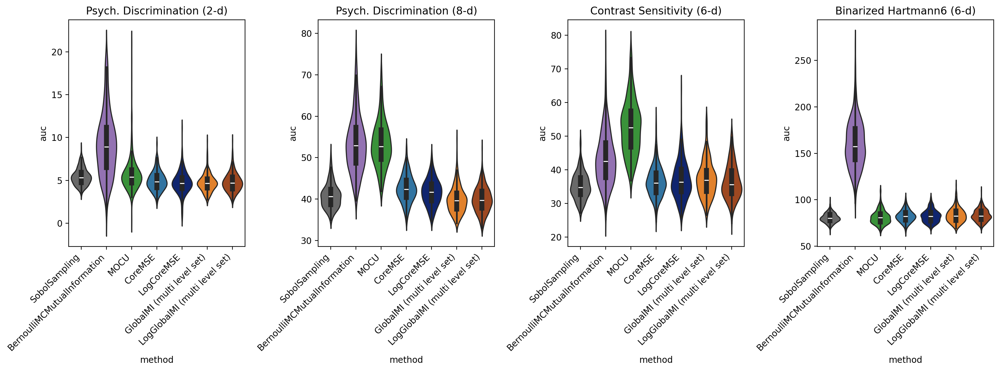

In [74]:
# yes/no question
title_dict={
            "discrim_lowdim": "Psych. Discrimination (2-d)",
            "discrim_highdim": "Psych. Discrimination (8-d)",
            "contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
            "hartmann6_binary": "Binarized Hartmann6 (6-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)",
           }
from sklearn.metrics import auc
auc_df["method"]=auc_df.method.apply(lambda x: f"{x} (multi level set)" if x in ["GlobalMI", "LogGlobalMI"] else x)
problems=list(title_dict.keys())[:-1]
methods=method_map.keys()
fig,ax=plt.subplots(1, len(problems), figsize=(4*len(problems), 6), dpi=200)

for i_problem, problem_name in enumerate(problems):
    data_subset=auc_df[(auc_df.problem_name==problem_name)]
    # a=data_subset[data_subset.method=="LogGlobalMI (multi level set)"].auc
    # b=data_subset[data_subset.method=="SobolSampling"].auc
    # length=min(len(a), len(b))
    # print(problem_name, ttest_rel(a[:length],b[:length]))
    sns.violinplot(data_subset, x="method", y="auc", hue="method", ax=ax[i_problem], order=list(method_map.keys()), palette=method_map)
    ax[i_problem].set_title(title_dict[problem_name])
    ax[i_problem].set_xticks(ax[i_problem].get_xticks())
    ax[i_problem].set_xticklabels(ax[i_problem].get_xticklabels(), rotation=45, ha="right")
# ax[0].legend()
fig.tight_layout()
plt.xticks(rotation=45)
fig.savefig("figures/single_stim_method_auc_results.png", bbox_inches="tight")

In [ ]:
for i_problem, problem_name in enumerate(problems):
    for i_method, method in enumerate(methods):
        data_subset=data[(data.problem_name==problem_name) & (data.method==method)]
        if len(data_subset) == 0:
            continue
        if problem_name == "discrim_lowdim" or problem_name == "remote_haptics_2d":
            data_subset=data_subset[data_subset.trial_id <= 500]
        data_subset=data_subset[["trial_id", "expected_brier", "rep"]]
        auc_df=[]
        for rep in data_subset.rep.unique():
            rep_data=data_subset[data_subset.rep==rep]
            xx = rep_data.trial_id.to_numpy()
            yy = rep_data.expected_brier.to_numpy()
            auc = auc(xx,yy)
            auc_df.append({"rep": rep, "auc": auc})
        auc_df=pd.concat(auc_df)
        sns.violinplot(x=method, y=mean_auc, ax=ax[i_problem])

ValueError: Could not interpret value `SobolSampling` for `x`. Value is a string, but `data` was not passed.

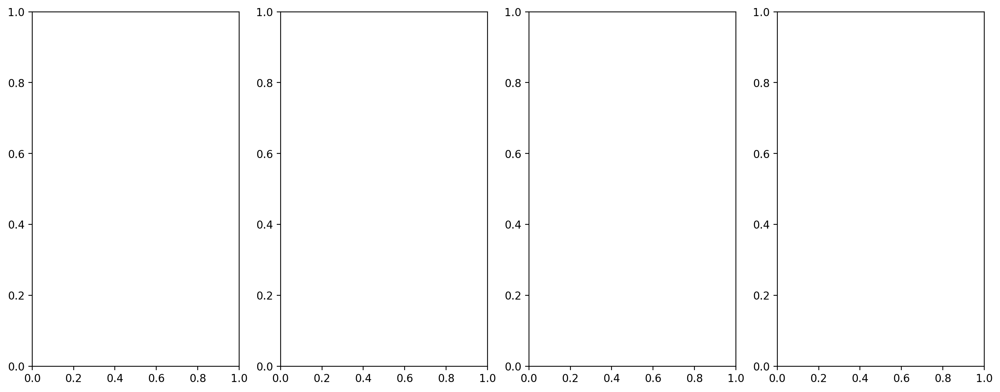

In [30]:
# yes/no question
title_dict={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
            "hartmann6_binary": "Binarized Hartmann6 (6-d)",
            "discrim_lowdim": "Psych. Discrimination (2-d)",
            "discrim_highdim": "Psych. Discrimination (8-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)",
            "hartmann_binary_high_dim_10": "Binarized Hartmann6 (10-d)"
           }
from sklearn.metrics import auc
data["method"]=data.method.apply(lambda x: f"{x} (multi level set)" if x in ["GlobalMI", "LogGlobalMI"] else x)
problems=list(set(data.problem_name.unique()) - set(['remote_haptics_2d']))
methods=method_map.keys()
fig,ax=plt.subplots(1, len(problems), figsize=(4*len(problems), 6), dpi=200)

for i_problem, problem_name in enumerate(problems):
    for i_method, method in enumerate(methods):
        data_subset=data[(data.problem_name==problem_name) & (data.method==method)]
        if len(data_subset) == 0:
            continue
        if problem_name == "discrim_lowdim" or problem_name == "remote_haptics_2d":
            data_subset=data_subset[data_subset.trial_id <= 500]
        data_subset=data_subset[["trial_id", "expected_brier", "rep"]]
        auc_df=[]
        for rep in data_subset.rep.unique():
            rep_data=data_subset[data_subset.rep==rep]
            xx = rep_data.trial_id.to_numpy()
            yy = rep_data.expected_brier.to_numpy()
            auc = auc(xx,yy)
            auc_df.append({"rep": rep, "auc": auc})
        auc_df=pd.concat(auc_df)
        sns.violinplot(x=method, y=mean_auc, ax=ax[i_problem])
            
        # data_mean=data_subset.groupby("trial_id").expected_brier.mean().reset_index()
        # xx = data_mean.trial_id.to_numpy()
        # yy = data_mean.expected_brier.to_numpy()
        # mean_auc = auc(xx,yy)
        # rep_aucs=[]
        # for rep in data_subset.rep.unique():
        #     data_rep=data_subset[data_subset.rep==rep][["trial_id", "expected_brier"]]
        #     xx = data_rep.trial_id.to_numpy()
        #     yy = data_rep.expected_brier.to_numpy()
        #     rep_aucs.append(auc(xx,yy))
        # auc_std = np.array(rep_aucs).std()
        # auc_ste = auc_std / np.sqrt(len(rep_aucs))

        # ax[i_problem].bar(method, mean_auc, color=method_map[method])
        # ax[i_problem].errorbar(method, mean_auc, auc_ste, fmt='.', color='Black', elinewidth=2, capthick=10,errorevery=1, alpha=0.5, ms=4, capsize = 2)
        sns.violinplot(x=method, y=mean_auc, ax=ax[i_problem])
        ax[i_problem].set_title(title_dict[problem_name])
    ax[i_problem].set_xticks(ax[i_problem].get_xticks())
    ax[i_problem].set_xticklabels(ax[i_problem].get_xticklabels(), rotation=45, ha="right")
# ax[0].legend()
fig.tight_layout()
plt.xticks(rotation=45)
# fig.savefig("figures/single_stim_method_auc_results.png", bbox_inches="tight")

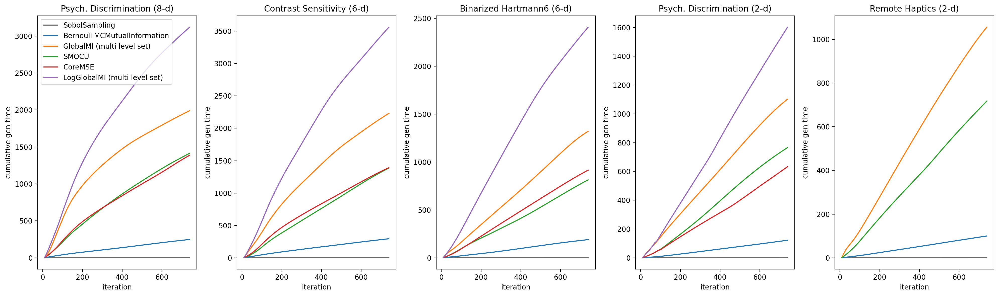

In [54]:
# yes/no question
title_dict={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
           "hartmann6_binary": "Binarized Hartmann6 (6-d)",
           "discrim_lowdim": "Psych. Discrimination (2-d)",
           "discrim_highdim": "Psych. Discrimination (8-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)"
           }
data["method"]=data.method.apply(lambda x: f"{x} (multi level set)" if x in ["GlobalMI", "LogGlobalMI"] else x)
problems=data.problem_name.unique()
methods=data.method.unique()
fig,ax=plt.subplots(1, len(problems), figsize=(4*len(problems), 6), dpi=200)

for i_problem, problem_name in enumerate(problems):
    for i_method, method in enumerate(methods):
        color=f"C{i_method-1}" if method != "SobolSampling" else "dimgray"
        data_subset=data[(data.problem_name==problem_name) & (data.method==method)]
        data_subset=data_subset[["trial_id", "cum_gen_time"]]
        data_subset=data_subset.groupby("trial_id").mean().reset_index()
        if i_problem==0:
            ax[i_problem].plot(data_subset.trial_id, data_subset["cum_gen_time"], label=method, color=color)
        else:
            ax[i_problem].plot(data_subset.trial_id, data_subset["cum_gen_time"], color=color)
        ax[i_problem].set_xlabel(f"iteration")
        ax[i_problem].set_title(title_dict[problem_name])
        ax[i_problem].set_ylabel("cumulative gen time")
ax[0].legend()
fig.tight_layout()
fig.savefig("figures/single_stim_method_cum_gen_time.png", bbox_inches="tight")

## Brier score prior comparison

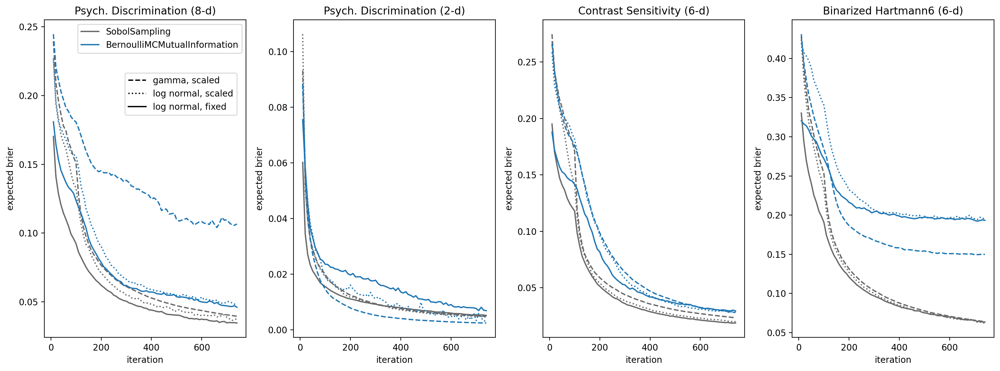

In [16]:
# yes/no question
title_dict={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
           "hartmann6_binary": "Binarized Hartmann6 (6-d)",
           "discrim_lowdim": "Psych. Discrimination (2-d)",
           "discrim_highdim": "Psych. Discrimination (8-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)"
           }
# data["method"]=data.method.apply(lambda x: "GlobalMI (multi level set)" if x=="GlobalMI" else x)
combs=[("gamma", "scaled"), ("log_normal", "scaled"), ("log_normal", "fixed")]
linestyle=["dashed", "dotted", "solid", ]
problems=['discrim_highdim', 'discrim_lowdim', 'contrast_sensitivity_6d', 'hartmann6_binary']
methods=data.method.unique()[:-1]
fig,ax=plt.subplots(1, len(problems), figsize=(4*len(problems), 6), dpi=200)

for i_problem, problem_name in enumerate(problems):
    for i_method, method in enumerate(methods):
        color=f"C{i_method-1}" if method != "SobolSampling" else "dimgray"
        for i_comb, comb in enumerate(combs):
            data_subset=data[(data.problem_name==problem_name) & (data.method==method) & (data.prior==comb[0]) & (data.lengthscale==comb[1])]
            data_subset=data_subset[["trial_id", "expected_brier"]]
            data_subset=data_subset.groupby("trial_id").mean().reset_index()
            if i_problem==0 and i_comb==2:
                ax[i_problem].plot(data_subset.trial_id, data_subset["expected_brier"], label=method, color=color, linestyle=linestyle[i_comb])
            else:
                ax[i_problem].plot(data_subset.trial_id, data_subset["expected_brier"], color=color, linestyle=linestyle[i_comb])
            ax[i_problem].set_xlabel(f"iteration")
            ax[i_problem].set_title(title_dict[problem_name])
            ax[i_problem].set_ylabel("expected brier")
import matplotlib.lines as mlines
line0, = ax[0].plot([],[],c="black",ls=linestyle[0])
line1, = ax[0].plot([],[],c="black",ls=linestyle[1])
line2, = ax[0].plot([],[],c="black",ls=linestyle[2])
legend2 = ax[0].legend([line0, line1, line2], ["gamma, scaled", "log normal, scaled", "log normal, fixed"], loc=(0.4, 0.7))
ax[0].add_artist(legend2)
ax[0].legend()
fig.tight_layout()
# fig.savefig("figures/prior_comparison_results.png", bbox_inches="tight")

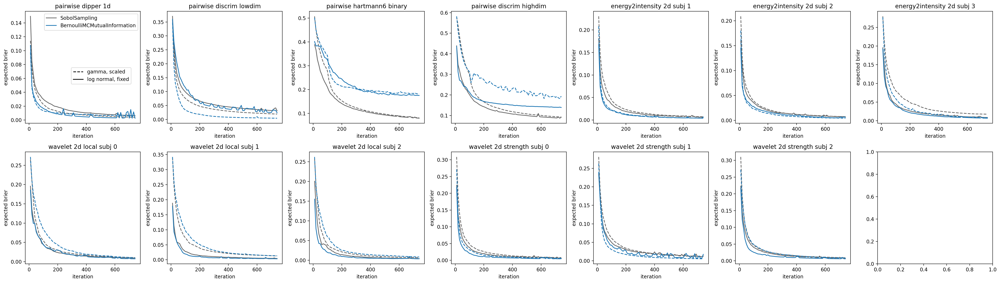

In [21]:
# pairwise questions
combs=[("gamma", "scaled"), ("log_normal", "fixed")]
linestyle=["dashed", "solid", ]
problems=data.problem_name.unique()
methods=['SobolSampling', 'BernoulliMCMutualInformation']
n_cols=int(np.ceil(len(problems)/2))
fig,ax=plt.subplots(2, n_cols, figsize=(4*n_cols, 4 * 2), dpi=200)

for i_problem, problem_name in enumerate(problems):
    for i_method, method in enumerate(methods):
        color=f"C{i_method-1}" if method != "SobolSampling" else "dimgray"
        for i_comb, comb in enumerate(combs):
            data_subset=data[(data.problem_name==problem_name) & (data.method==method) & (data.prior==comb[0]) & (data.lengthscale==comb[1])]
            data_subset=data_subset[["trial_id", "expected_brier"]]
            data_subset=data_subset.groupby("trial_id").mean().reset_index()
            if i_problem==0 and i_comb==1:
                ax[i_problem // n_cols, i_problem % n_cols].plot(data_subset.trial_id, data_subset["expected_brier"], label=method, color=color, linestyle=linestyle[i_comb])
            else:
                ax[i_problem // n_cols, i_problem % n_cols].plot(data_subset.trial_id, data_subset["expected_brier"], color=color, linestyle=linestyle[i_comb])
            ax[i_problem // n_cols, i_problem % n_cols].set_xlabel(f"iteration")
            ax[i_problem // n_cols, i_problem % n_cols].set_title(" ".join(problem_name.split("_")))
            ax[i_problem // n_cols, i_problem % n_cols].set_ylabel("expected brier")
import matplotlib.lines as mlines
line0, = ax[0,0].plot([],[],c="black",ls=linestyle[0])
line1, = ax[0,0].plot([],[],c="black",ls=linestyle[1])
legend2 = ax[0,0].legend([line0, line1], ["gamma, scaled", "log normal, fixed"], loc=(0.4, 0.35))
ax[0,0].add_artist(legend2)
ax[0,0].legend()
fig.tight_layout()
# fig.savefig("figures/pairwise_prior_comparison_results.png", bbox_inches="tight")

## contour lines comparison

/tmp/ipykernel_3041967/4253534126.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_method.loc[:, "average_misclass_on_f"]=data_method.loc[:, cols].mean(axis=1)
/tmp/ipykernel_3041967/4253534126.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_method.loc[:, "average_misclass_on_f"]=data_method.loc[:, cols].mean(axis=1)
/tmp/ipykernel_3041967/4253534126.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

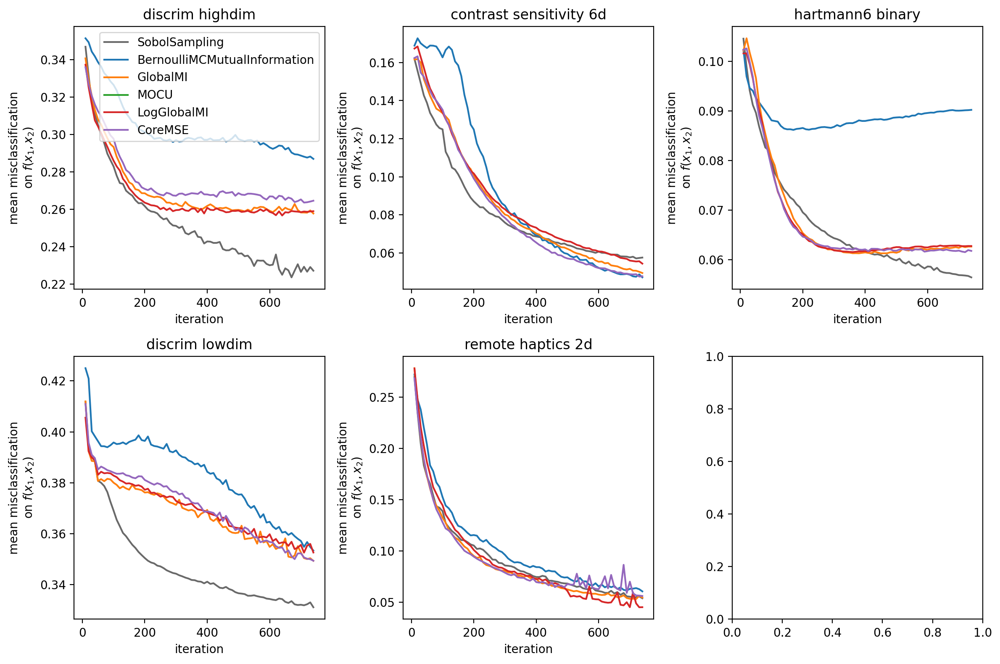

In [143]:
combs=[("gamma", "scaled"), ("log_normal", "fixed")]
linestyle=["dashed", "solid", ]
problems=data.problem_name.unique()
methods=['SobolSampling', 'BernoulliMCMutualInformation', 'GlobalMI', 'MOCU', 'LogGlobalMI', 'CoreMSE']
n_cols=int(np.ceil(len(problems)/2))
fig,ax=plt.subplots(2, n_cols, figsize=(4*n_cols, 8), dpi=200)
for i_problem, problem_name in enumerate(problems):
    data_subset=data[(data.problem_name==problem_name)]
    cols=[c for c in data_subset.columns if "misclass_on_f" in c and not np.any(data_subset[c].isna())]
    if problem_name == "pairwise_discrim_lowdim":
        cols = [f"misclass_on_f_thresh_{i}" for i in np.arange(-8, 9)]
    for i_method, method in enumerate(methods):
            color=f"C{i_method-1}" if method != "SobolSampling" else "dimgray"
            for i_comb, comb in enumerate(combs):
                data_method=data_subset[(data_subset.method==method) & (data_subset.prior==comb[0]) & (data_subset.lengthscale==comb[1])]
                data_method.loc[:, "average_misclass_on_f"]=data_method.loc[:, cols].mean(axis=1)
                avg_misclass = data_method.groupby("trial_id").average_misclass_on_f.mean().reset_index()
                if i_problem==0 and i_comb == 1:
                    ax[i_problem // n_cols, i_problem % n_cols].plot(avg_misclass.trial_id, 
                                                                     avg_misclass.average_misclass_on_f, 
                                                                     label=method, color=color, linestyle=linestyle[i_comb])
                else:
                    ax[i_problem // n_cols, i_problem % n_cols].plot(avg_misclass.trial_id, 
                                                                     avg_misclass.average_misclass_on_f, 
                                                                     color=color, 
                                                                     linestyle=linestyle[i_comb])
    ax[i_problem // n_cols, i_problem % n_cols].set_xlabel(f"iteration")
    ax[i_problem // n_cols, i_problem % n_cols].set_title(" ".join(problem_name.split("_")))
    ax[i_problem // n_cols, i_problem % n_cols].set_ylabel("mean misclassification\n"+r"on $f(x_1,x_2)$")
# import matplotlib.lines as mlines
# line0, = ax[0,0].plot([],[],c="black",ls=linestyle[0])
# line1, = ax[0,0].plot([],[],c="black",ls=linestyle[1])
# legend2 = ax[0,0].legend([line0, line1], ["gamma, scaled", "log normal, fixed"], loc=(0.4, 0.45))
# ax[0,0].add_artist(legend2)
ax[0,0].legend()
fig.tight_layout()
fig.savefig("figures/avg_f_misclass.png", bbox_inches="tight", dpi=250)

KeyboardInterrupt: 

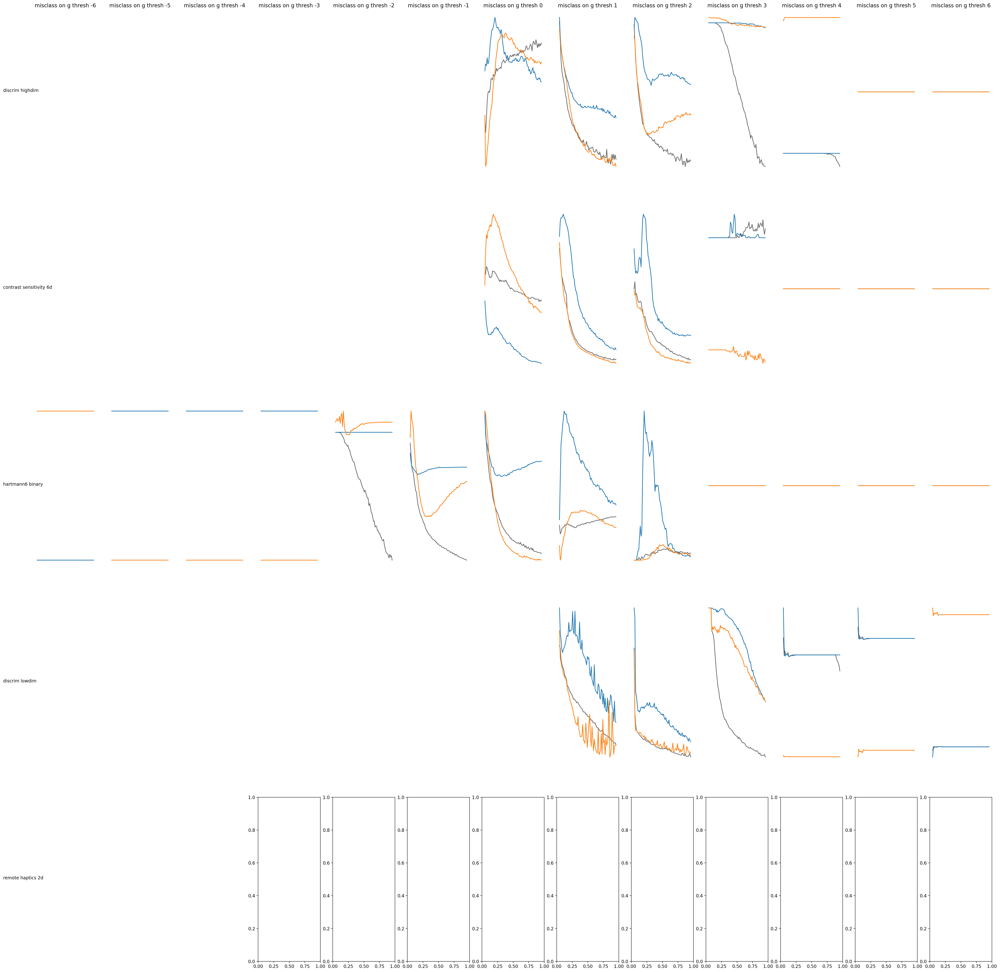

In [142]:
# pairwise questions
combs=[("gamma", "scaled"), ("log_normal", "fixed")]
linestyle=["dashed", "solid", ]
problems=data.problem_name.unique()
methods=['SobolSampling', 'BernoulliMCMutualInformation', 'GlobalMI', "MOCU"]
n_rows=len(problems)
cols = [f"misclass_on_f_thresh_{i}" for i in np.arange(-6, 7, 1)]
n_cols=len(cols)
fig,ax=plt.subplots(len(problems), n_cols, figsize=(3*n_cols, 3*n_cols), dpi=200)

for i_problem, problem_name in enumerate(problems):
    for i_col, metric in enumerate(cols):
        for i_method, method in enumerate(methods):
            color=f"C{i_method-1}" if method != "SobolSampling" else "dimgray"
            for i_comb, comb in enumerate(combs):
                data_subset=data[(data.problem_name==problem_name) & (data.method==method) & (data.prior==comb[0]) & (data.lengthscale==comb[1])]
                data_subset=data_subset[["trial_id", metric]]
                if len(data_subset) == 0:
                    ax[i_problem, i_col].axis("off")
                    continue
                data_subset=data_subset.groupby("trial_id").mean().reset_index()
                if i_problem==0 and i_comb==1:
                    ax[i_problem, i_col].plot(data_subset.trial_id, data_subset[metric], label=method, color=color, linestyle=linestyle[i_comb])
                else:
                    ax[i_problem, i_col].plot(data_subset.trial_id, data_subset[metric], color=color, linestyle=linestyle[i_comb])
        ax[i_problem, i_col].set_xlabel(f"iteration")
        if i_problem==0:
            title=metric.replace("f", "g")
            ax[i_problem, i_col].set_title(" ".join(title.split("_")))
        if i_col==0:
            ax[i_problem, i_col].annotate(" ".join(problem_name.split("_")), xy=(-0.5, 0.5), xycoords="axes fraction")
# import matplotlib.lines as mlines
# line0, = ax[0,0].plot([],[],c="black",ls=linestyle[0])
# line1, = ax[0,0].plot([],[],c="black",ls=linestyle[1])
# legend2 = ax[0,0].legend([line0, line1], ["gamma, scaled", "log normal, fixed"], loc=(0.4, 0.45))
# ax[0,0].add_artist(legend2)
ax[0,0].legend()
fig.tight_layout()
fig.savefig("figures/misclass_on_f.png", bbox_inches="tight")

## level set comparison with log methods

In [133]:
def threshold_map(x):
    if x == 0.5 or x == 0.8 or x==0.75:
        return "middle"
    elif x == 0.9:
        return "high"
    else:
        return "low"

data["threshold_name"]=data["threshold"].apply(lambda x: threshold_map(x))

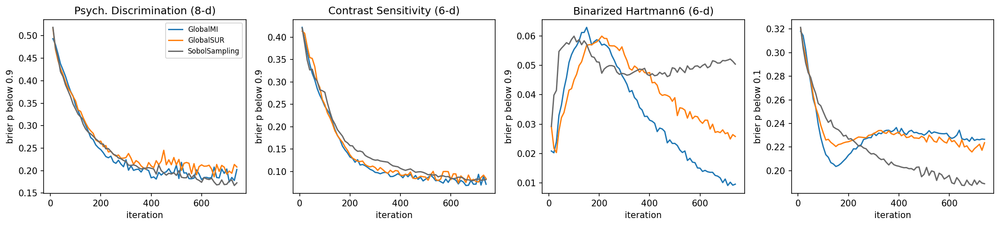

In [117]:
title_dict={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
           "hartmann6_binary": "Binarized Hartmann6 (6-d)",
           "discrim_lowdim": "Psych. Discrimination (2-d)",
           "discrim_highdim": "Psych. Discrimination (8-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)"
           }
thresholds=["high", "low"]
# problems=data.problem_name.unique()
problems=['discrim_highdim', 'contrast_sensitivity_6d', 'hartmann6_binary']
methods=['GlobalMI', 'GlobalSUR', 'SobolSampling']
# methods=['GlobalMI', 'LogGlobalMI', 'GlobalSUR','LogGlobalSUR', 'SobolSampling']
fig,ax=plt.subplots(1, len(problems) + 1, figsize=(4*(len(problems) + 1), 3.7), dpi=150)

for i_problem, problem_name in enumerate(problems):
    for i_threshold, threshold_name in enumerate(thresholds):
        for i_method, method in enumerate(methods):
            color="dimgray" if method == "SobolSampling" else f"C{i_method}"
            if method != 'SobolSampling':
                data_subset=data[(data.problem_name==problem_name) & (data.method==method) & (data.threshold_name==threshold_name)]
                if len(data_subset) == 0:
                    continue
                threshold=data_subset.threshold.unique()
                threshold=threshold[0]
                if threshold == 0.8:
                    threshold=0.75
            else:
                data_subset=data[(data.problem_name==problem_name) & (data.method==method)]
            if threshold==0.6:
                continue
            if problem_name=="hartmann6_binary" and threshold_name=="high":
                reps=data_subset[data_subset.trial_id==10]
                reps=reps[reps["brier_p_below_0.9"] <= 0.1].rep.unique()
                data_subset=data_subset[data_subset.rep.isin(reps)]
            data_subset=data_subset[["trial_id", f"brier_p_below_{threshold}"]]
            data_subset=data_subset.groupby("trial_id").mean().reset_index()
            if i_problem == 0 and i_threshold == 0:
                ax[i_problem].plot(data_subset.trial_id, data_subset[f"brier_p_below_{threshold}"], color=color, label=method, linestyle=linestyle)
            else:
                if threshold==0.1 and i_method==0:
                    i_problem+=1
                ax[i_problem].plot(data_subset.trial_id, data_subset[f"brier_p_below_{threshold}"], color=color, linestyle=linestyle)
            ax[i_problem].set_ylabel(" ".join(f"brier_p_below_{threshold}".split("_")))
            ax[i_problem].set_xlabel(f"iteration")
            if i_threshold==0:
                ax[i_problem].set_title(title_dict[problem_name])
ax[0].legend(fontsize=8)
fig.tight_layout()
fig.savefig("figures/highdim_brier_p.png", bbox_inches="tight")

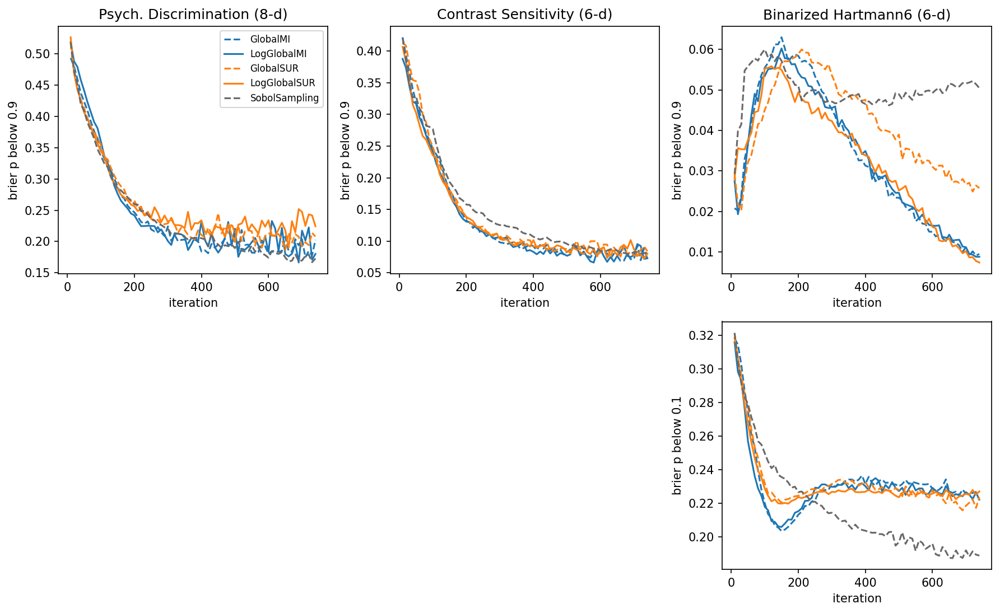

In [136]:
title_dict={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
           "hartmann6_binary": "Binarized Hartmann6 (6-d)",
           "discrim_lowdim": "Psych. Discrimination (2-d)",
           "discrim_highdim": "Psych. Discrimination (8-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)"
           }
thresholds=["high", "low"]
# problems=data.problem_name.unique()
problems=['discrim_highdim', 'contrast_sensitivity_6d', 'hartmann6_binary']
# methods=['GlobalMI', 'GlobalSUR', 'SobolSampling']
methods=['GlobalMI', 'LogGlobalMI', 'GlobalSUR','LogGlobalSUR', 'SobolSampling']
fig,ax=plt.subplots(len(thresholds), len(problems), figsize=(4*len(problems), 3.7*len(thresholds)), dpi=150)

for i_problem, problem_name in enumerate(problems):
    for i_threshold, threshold_name in enumerate(thresholds):
        for i_method, method in enumerate(methods):
            color="dimgray" if method == "SobolSampling" else f"C{i_method//2}"
            linestyle="dashed" if i_method % 2 == 0 else "solid"
            # linestyle="solid"
            if method != 'SobolSampling':
                data_subset=data[(data.problem_name==problem_name) & (data.method==method) & (data.threshold_name==threshold_name)]
                if len(data_subset) == 0:
                    continue
                threshold=data_subset.threshold.unique()
                threshold=threshold[0]
                if threshold == 0.8:
                    threshold=0.75
            else:
                data_subset=data[(data.problem_name==problem_name) & (data.method==method)]
            if threshold==0.6:
                ax[i_threshold, i_problem].axis("off")
                continue
            if problem_name=="hartmann6_binary" and threshold_name=="high":
                reps=data_subset[data_subset.trial_id==10]
                reps=reps[reps["brier_p_below_0.9"] <= 0.1].rep.unique()
                data_subset=data_subset[data_subset.rep.isin(reps)]
            data_subset=data_subset[["trial_id", f"brier_p_below_{threshold}"]]
            data_subset=data_subset.groupby("trial_id").mean().reset_index()
            if i_problem == 0 and i_threshold == 0:
                ax[i_threshold, i_problem].plot(data_subset.trial_id, data_subset[f"brier_p_below_{threshold}"], color=color, label=method, linestyle=linestyle)
            else:
                ax[i_threshold, i_problem].plot(data_subset.trial_id, data_subset[f"brier_p_below_{threshold}"], color=color, linestyle=linestyle)
            ax[i_threshold, i_problem].set_ylabel(" ".join(f"brier_p_below_{threshold}".split("_")))
            ax[i_threshold, i_problem].set_xlabel(f"iteration")
            if i_threshold==0:
                ax[i_threshold, i_problem].set_title(title_dict[problem_name])
ax[0,0].legend(fontsize=8)
fig.tight_layout()
fig.savefig("figures/highdim_brier_p_log.png", bbox_inches="tight")

## entropy reduction

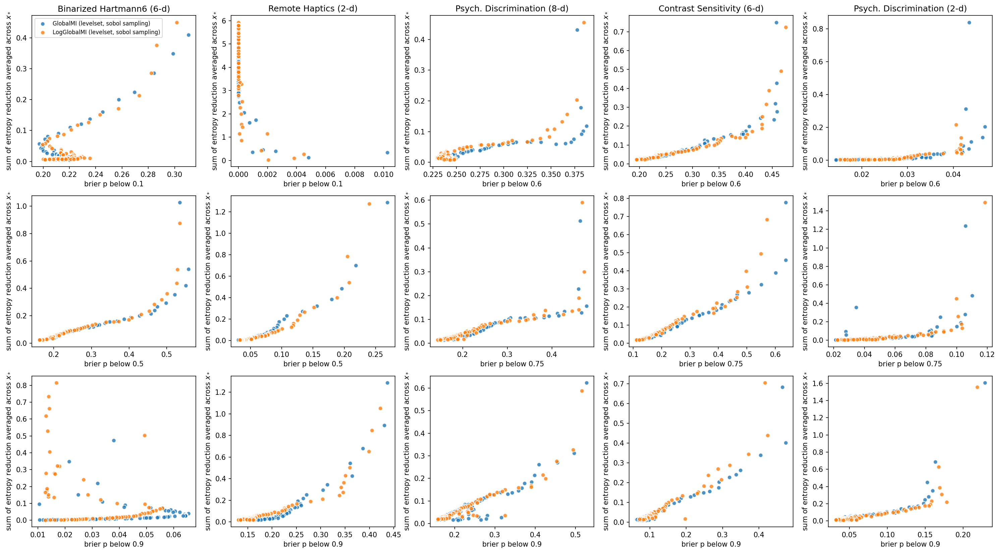

In [135]:
title_dict={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
           "hartmann6_binary": "Binarized Hartmann6 (6-d)",
           "discrim_lowdim": "Psych. Discrimination (2-d)",
           "discrim_highdim": "Psych. Discrimination (8-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)"
           }
thresholds=data.threshold_name.unique()
problems=data.problem_name.unique()
methods=data.method.unique()
fig,ax=plt.subplots(len(thresholds), len(problems), figsize=(4*len(problems), 3.7*len(thresholds)), dpi=150)

for i_problem, problem_name in enumerate(problems):
    for i_threshold, threshold_name in enumerate(['low', 'middle', 'high']):
        for i_method, method in enumerate(methods[1:]):
            data_subset=data[(data.problem_name==problem_name) & (data.method==method) & (data.threshold_name==threshold_name)]
            threshold=data_subset.threshold.unique()
            assert len(threshold)==1
            threshold=threshold.item()
            if threshold == 0.8:
                threshold=0.75
            data_rep = data_subset[["trial_id", f"brier_p_below_{threshold}", "acqf_sum_mean"]]
            # data_subset=data_subset[["rep", "trial_id", f"brier_p_below_{threshold}", "acqf_sum_mean"]]
            # for i_rep, rep in enumerate(data_subset.rep.unique()):
            #     data_rep=data_subset[data_subset.rep==rep][["trial_id", f"brier_p_below_{threshold}", "acqf_sum_mean"]]
            data_rep=data_rep.groupby("trial_id").mean().reset_index()
            if i_problem == 0 and i_threshold == 0:
                ax[i_threshold, i_problem].scatter(data_rep[f"brier_p_below_{threshold}"], 
                                                   data_rep.acqf_sum_mean, 
                                                   edgecolor="white",
                                                   color=f"C{i_method}",
                                                   label=method, alpha=0.8)
            else:
                ax[i_threshold, i_problem].scatter(data_rep[f"brier_p_below_{threshold}"], 
                                                   data_rep.acqf_sum_mean, 
                                                   edgecolor="white",
                                                   color=f"C{i_method}",
                                                   alpha=0.8)
            ax[i_threshold, i_problem].set_ylabel(r"sum of entropy reduction averaged across $x_*$")
            ax[i_threshold, i_problem].set_xlabel(" ".join(f"brier_p_below_{threshold}".split("_")))
            if i_threshold==0:
                ax[i_threshold, i_problem].set_title(title_dict[problem_name])
ax[0,0].legend(fontsize=8)
fig.tight_layout()
fig.savefig("figures/entropy_reduction_and_brier_score.png", bbox_inches="tight", dpi=200)

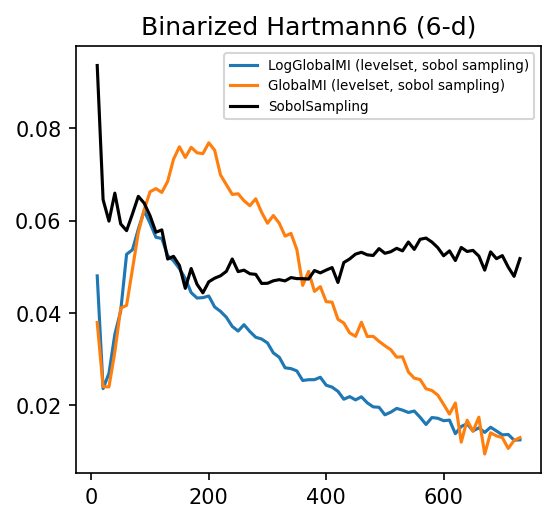

In [252]:
title_dict={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
           "hartmann6_binary": "Binarized Hartmann6 (6-d)",
           "discrim_lowdim": "Psych. Discrimination (2-d)",
           "discrim_highdim": "Psych. Discrimination (8-d)",
            "remote_haptics_2d": "Remote Haptics (2-d)"
           }
metric="brier_p_below_0.9"
data_subset=data[~data[metric].isna()]
problems = data.problem_name.unique()
data_subset=data[["problem_name", metric, "trial_id", "method", "lengthscale"]]
fig,ax=plt.subplots(1, len(problems), figsize=(4*len(problems), 3.7), dpi=150)
for i_problem, problem in enumerate(problems):
    for i_method, method in enumerate(data_subset.method.unique()[::-1]):
        # for i_prior, prior in enumerate(data_subset.prior.unique()):
        for i_metric, metric in enumerate(
            # linestyle="dashed" if prior=="gamma" else "solid"
            # linestyle="dashed" if lengthscale=="fixed" else "solid"
            linestyle="solid"
            d=data_subset[(data_subset.problem_name==problem) & (data_subset.method==method) & (data_subset.lengthscale==lengthscale)]
            d=d.drop(columns=["method", "lengthscale", "problem_name"])
            std=d.groupby(["trial_id"]).std().reset_index()
            d=d.groupby(["trial_id"]).mean().reset_index()
            color=f"C{i_method}" if method != "SobolSampling" else "black"
            if i_prior == 0:
                ax.plot(d.trial_id, d[metric], linestyle="solid", color=color, label=method)
            else:
                ax.plot(d.trial_id, d[metric], linestyle="solid", color=color)
            # ax[i_problem].fill_between(d.trial_id, d[metric]+std[metric], d[metric]-std[metric], alpha=0.2, color=color)
    if i_problem==0:
        ax.legend(fontsize=6.5)
    ax.set_title(title_dict[problem])
# fig.savefig(f"figures/{metric}_log_normal_lengthscale.png", bbox_inches="tight", dpi=200)

In [134]:
methods=["benchmark/sobol", "benchmark/baseline", "benchmark_importance_samps"] #"sobol", "levelset", "BALD"
data=[]
for method in methods:
    data_root=os.path.join("data", method)
    data_paths=glob.glob(os.path.join(data_root,"*_out.csv"))
    # if "importance_samps" in method:
    #     data_paths = [data_path for data_path in data_paths if "pareto_front" in data_path and "integration" not in data_path]
    # data_paths=[d for d in data_paths if int(d.split("chunk")[-1].split("_out")[0])<1]
    print(len(data_paths))
    for data_path in data_paths:
        df = pd.read_csv(data_path, index_col=0)
        data.append(df)
data=pd.concat(data).reset_index()
final_idx=[0]+(np.where(data[["final"]]==True)[0]+1).tolist()
data_idx=[[i]*(n) for i,n in enumerate(np.diff(final_idx))]
data_idx=list(itertools.chain(*data_idx))
data["rep"]=data_idx

67
47
28


In [164]:
data["trial_id_reindex"]=data["trial_id"]
data=data[data.trial_id_reindex<=740]

def method_map(x, columns):
    # different lookahead types
    generator=x.opt_strat_generator
    
    if generator == 'SobolGenerator':
        return "SobolSampling"

    x_acqf=x[f"{generator}_acqf"]
    if f"{x_acqf}_lookahead_type" in columns:
        return f"{x_acqf} ({" ".join(x[f'{x_acqf}_lookahead_type'].split("_"))})"
    else:
        return x_acqf
        
data["method"]=data.apply(lambda x: method_map(x, list(data.columns)), axis=1)

/tmp/ipykernel_168589/3143854046.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["method"]=data.apply(lambda x: method_map(x, list(data.columns)), axis=1)


In [126]:
df=data[(data.problem_name=="discrim_highdim") & (data.method=="GlobalMI (multi levelset)")]
np.unique(df[["rep", "trial_id"]].groupby("rep").min(), return_counts=True)

(array([10, 20, 30]), array([70, 15,  1]))

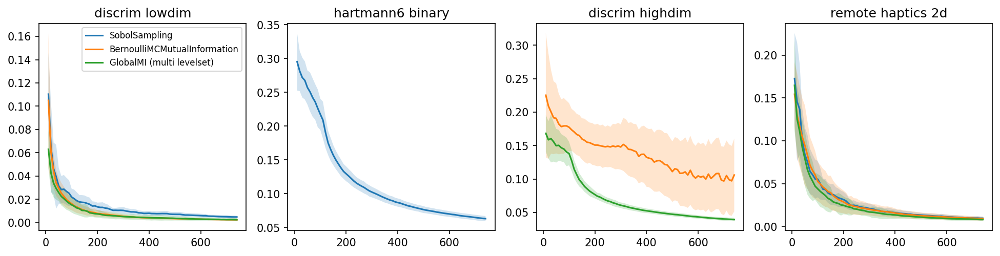

In [140]:

metric="expected_brier"
fig,ax=plt.subplots(1,4,figsize=(4*4, 3.5),dpi=150)
for i_problem, problem_name in enumerate(["discrim_lowdim", "hartmann6_binary", "discrim_highdim", "remote_haptics_2d"]):
    problem_df = data[data.problem_name == problem_name]
    problem_df=problem_df[["method", "trial_id_reindex", metric]]
    problem_mean=problem_df.groupby(["method", "trial_id_reindex"]).mean().reset_index()
    problem_std=problem_df.groupby(["method", "trial_id_reindex"]).std().reset_index()
    for i_method, method in enumerate(data.method.unique()):
        method_mean = problem_mean[problem_mean.method==method]
        method_std=problem_std[problem_std.method==method]
        ax[i_problem].plot(method_mean.trial_id_reindex, method_mean[metric], label=method)
        ax[i_problem].fill_between(method_mean.trial_id_reindex, method_mean[metric]-method_std[metric], method_mean[metric]+method_std[metric], alpha=0.2)
    ax[i_problem].set_title(" ".join(problem_name.split("_")))
ax[0].legend(fontsize=8)
# fig.savefig("figures/sobol_samples_std.png")

In [51]:
problem_order=np.unique(data.problem_name)
problem_subset1 = problem_order[:3]
problem_subset2 = problem_order[3:5]
def title_map(title):
    if "remote_haptics" in title:
        return " ".join(title.split("_"))
    else:
        title_dict={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
                   "hartmann6_binary": "Binarized Hartmann6 (6-d)",
                   "discrim_lowdim": "Psych. Discrimination (2-d)",
                   "discrim_highdim": "Psych. Discrimination (8-d)"}
        return title_dict[title]

problem_name = "remote_haptics_2d"
# prob_range = np.linspace(0.55, 0.95, 5)
n_rows = len(prob_range)
prob_range = np.round(np.linspace(0.1, 0.9, 5), 1)
col_names = [f"brier_p_below_{prob}" for prob in prob_range]
print(col_names)

data_subset=data[data.problem_name.isin(problem_subset2)]
fig,ax=plt.subplots(2, 5, figsize=(3.5*5,2.9*2),dpi=200)
for i_col, col_name in enumerate(col_names):
    problem_df=data_subset[["method", "trial_id_reindex", "problem_name", col_name]]
    problem_df=problem_df.groupby(["method", "problem_name", "trial_id_reindex"]).mean().reset_index()
    problem_df = problem_df[(problem_df.problem_name==problem_name)]
    for i, method in enumerate(["SobolSampling", "GlobalMI (multi levelset)"]):
        df = problem_df[problem_df.method == method]
        ax[0, i_col].plot(df.trial_id_reindex, df[col_name], color="darkgrey" if method == "SobolSampling" else f"C{i}", label=method)
    ax[0, i_col].set_title(" ".join(col_name.split("_")))

    threshold = float(col_name.split("_")[-1])
    valid_df = data_subset[(data_subset.method == "GlobalMI (levelset)") & (data_subset.GlobalMI_target == threshold)]
    if len(valid_df) <= 2:
        ax[1, i_col].axis("off")
        continue
    else:
        df = problem_df[problem_df.method == "SobolSampling"]
        ax[1, i_col].plot(df.trial_id_reindex, df[col_name], color="darkgrey", label="SobolSampling")
        method = "GlobalMI (levelset)"
        problem_df=valid_df[["method", "trial_id_reindex", "problem_name", col_name]]
        problem_df=problem_df.groupby(["method", "problem_name", "trial_id_reindex"]).mean().reset_index()
        problem_df = problem_df[(problem_df.problem_name==problem_name)]
        ax[1, i_col].plot(problem_df.trial_id_reindex, problem_df[col_name], color="C0", label=method)
ax[0, 0].legend()
ax[1, 0].legend()
plt.suptitle(title_map(problem_name), fontsize=15)
# fig.savefig(f"brier_score_comparison_{problem_name}.png", dpi=200, bbox_inches="tight")

NameError: name 'prob_range' is not defined

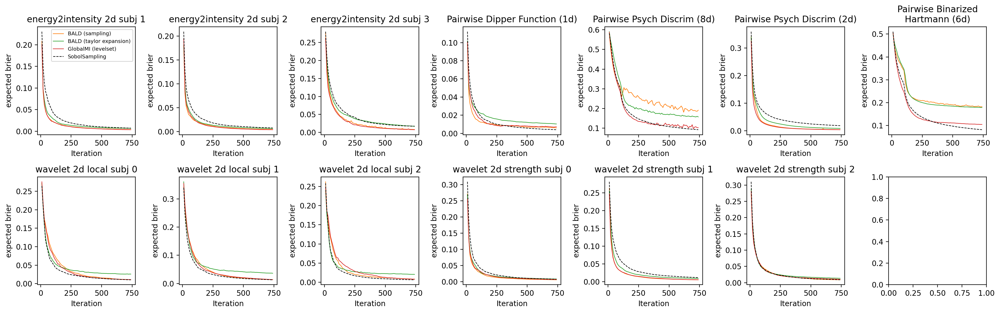

In [26]:
problem_order=sorted(data.problem_name.unique())
methods = ['BernoulliMCMutualInformation', "BALD", 'GlobalMI (levelset)', 'SobolSampling', ]
method_map={"BernoulliMCMutualInformation": "BALD (sampling)", "BALD": "BALD (taylor expansion)"}
def title_map(problem):
    title_map = {
        "pairwise_dipper_1d": "Pairwise Dipper Function (1d)",
        "pairwise_discrim_highdim": "Pairwise Psych Discrim (8d)",
        "pairwise_hartmann6_binary": "Pairwise Binarized\nHartmann (6d)",
        "pairwise_discrim_lowdim": "Pairwise Psych Discrim (2d)",
    }
    if problem in title_map.keys():
        return title_map[problem]
    else:
        return " ".join(problem.split("_"))
        
metric='expected_brier'
n_rows=2
n_cols=int(np.ceil(len(problem_order)/n_rows))
fig,ax=plt.subplots(n_rows, n_cols, figsize=(2.7*n_cols, n_rows*3),dpi=200)

for i_problem, problem in enumerate(problem_order):
    problem_df=data[["method", "trial_id_reindex", "problem_name", metric]]
    problem_df=problem_df.groupby(["method", "problem_name", "trial_id_reindex"]).mean().reset_index()
    problem_df=problem_df[(problem_df.problem_name==problem)]

    r,c=i_problem // n_cols, i_problem % n_cols
    for i_method, method in enumerate(methods):
        df=problem_df[(problem_df.method==method)]
        linestyle="dashed" if method in ["SobolSampling"] else "solid"
        color="black" if method=="SobolSampling" else f"C{i_method+1}"
        method =method_map[method] if method in method_map.keys() else method
        ax[r,c].plot(df.trial_id_reindex, df[metric], label=method, linestyle=linestyle, linewidth=0.8, color=color)
        ax[r,c].set_xticks(np.linspace(0,750,4).astype(int))
        ax[r,c].set_xticklabels(np.linspace(0,750,4).astype(int))
        ax[r,c].set_ylabel(" ".join(metric.split("_")))
        ax[r,c].set_xlabel("Iteration")
        ax[r,c].set_title(title_map(problem))
    if i_problem == 0:
        # ax[i_col].set_title(" ".join(title_map[problem].split("_")))
        ax[r,c].legend(loc="upper right",fontsize=7)
        # if i_col == 0:
        #     ax[i_problem].annotate(title_map[problem], xy=(-1, 0.5), xycoords="axes fraction",
        #                                   ha="center", va="baseline", fontsize=10)
plt.tight_layout()
plt.savefig(f"figures/pairwise_{metric}_results.png", dpi=200)

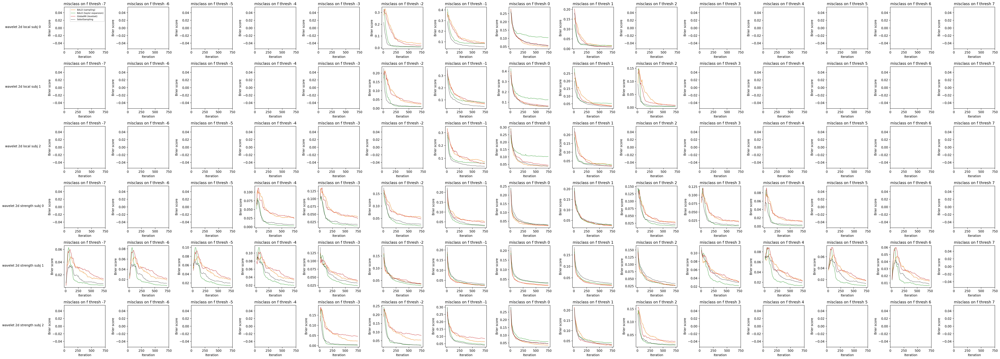

In [24]:
problem_order=sorted(data.problem_name.unique())[7:]
methods = ['BernoulliMCMutualInformation', "BALD", 'GlobalMI (levelset)', 'SobolSampling']
method_map={"BernoulliMCMutualInformation": "BALD (sampling)", "BALD": "BALD (taylor expansion)"}
def title_map(problem):
    title_map = {
        "pairwise_dipper_1d": "Pairwise Dipper Function (1d)",
        "pairwise_discrim_highdim": "Pairwise Psych Discrim (8d)",
        "pairwise_hartmann6_binary": "Pairwise Binarized\nHartmann (6d)",
        "pairwise_discrim_lowdim": "Pairwise Psych Discrim (2d)",
    }
    if problem in title_map.keys():
        return title_map[problem]
    else:
        return " ".join(problem.split("_"))
# cols=sorted([c for c in data.columns if "brier_p_below" in c][4:])[1:-1]
cols=[c for c in data.columns if "misclass_on_f_thresh" in c][28:43]
fig,ax=plt.subplots(len(problem_order), len(cols), figsize=(len(cols)*3, 2.7*len(problem_order)),dpi=200)
for i_col, col in enumerate(cols):
    for i_problem, problem in enumerate(problem_order):
        problem_df=data[["method", "trial_id_reindex", "problem_name", col]]
        problem_df=problem_df.groupby(["method", "problem_name", "trial_id_reindex"]).mean().reset_index()
        problem_df=problem_df[(problem_df.problem_name==problem)]
        for i_method, method in enumerate(methods):
            df=problem_df[(problem_df.method==method)]
            linestyle="dashed" if method in ["SobolSampling"] else "solid"
            color="black" if method=="SobolSampling" else f"C{i_method+1}"
            method =method_map[method] if method in method_map.keys() else method
            ax[i_problem, i_col].plot(df.trial_id_reindex, df[col], label=method, linestyle=linestyle, linewidth=0.8, color=color)
            ax[i_problem, i_col].set_xticks(np.linspace(0,750,4).astype(int))
            ax[i_problem, i_col].set_xticklabels(np.linspace(0,750,4).astype(int))
            ax[i_problem, i_col].set_ylabel("Brier score")
            ax[i_problem, i_col].set_xlabel("Iteration")
            title=" ".join(col.split("_"))
            ax[i_problem, i_col].set_title(title)
        if i_col == 0 and i_problem == 0:
            # ax[i_col].set_title(" ".join(title_map[problem].split("_")))
            ax[i_problem, i_col].legend(loc="upper right",fontsize=7)
        if i_col == 0:
            ax[i_problem, i_col].annotate(title_map(problem), xy=(-1, 0.5), xycoords="axes fraction",
                                          ha="center", va="baseline", fontsize=10)
plt.tight_layout()
plt.savefig("figures/pairwise_levelset_results_on_f_thresh_wavelet.png", dpi=200)

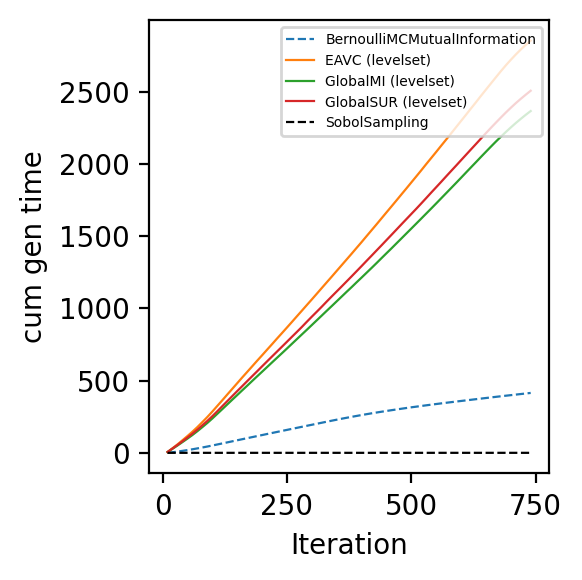

In [61]:

problem_order=data.problem_name.unique()
title_map = {'pairwise_discrim_lowdim': "Pairwise Psych Discrim (2d)"}
cols=["cum_gen_time"]
fig,ax=plt.subplots(1, len(cols), figsize=(len(cols)*3, 3),dpi=200)
for i_col, col in enumerate(cols):
    for i_problem, problem in enumerate(problem_order):
        problem_df=data[["method", "trial_id_reindex", "problem_name", col]]
        problem_df=problem_df.groupby(["method", "problem_name", "trial_id_reindex"]).mean().reset_index()
        problem_df=problem_df[(problem_df.problem_name==problem)]
        for i_method, method in enumerate(np.unique(data.method)):
            df=problem_df[(problem_df.method==method)]
            linestyle="dashed" if method in ["SobolSampling", "MCPosteriorVariance", "BernoulliMCMutualInformation"] else "solid"
            color="black" if method=="SobolSampling" else f"C{i_method}"
            ax.plot(df.trial_id_reindex, df[col], label=method, linestyle=linestyle, linewidth=0.8, color=color)
            ax.set_xticks(np.linspace(0,750,4).astype(int))
            ax.set_xticklabels(np.linspace(0,750,4).astype(int))
            ax.set_ylabel(" ".join(col.split("_")))
            ax.set_xlabel("Iteration")
            # title=" ".join(col.split("_"))
            # ax.set_title(title)
    if i_col == 0:
        # ax[i_col].set_title(" ".join(title_map[problem].split("_")))
        ax.legend(loc="upper right",fontsize=5)
plt.tight_layout()
plt.savefig(f"figures/pairwise_levelset_results_{cols[0]}.png", dpi=200)

In [41]:
methods=["sobol", "levelset_OptimizeAcqfGenerator"] #"multi_levelset", "multi_levelset_p_span", "multi_levelset_pareto_front"
sampling_method = "sobol_sampling"
record_thresholds=False
data=[]
for method in methods:
    data_root=os.path.join("data", "benchmark", method)
    data_paths=glob.glob(os.path.join(data_root,"*_out.csv"))
    if method == "sobol":
        data_paths = [data_path for data_path in data_paths if "exploration_baseline" not in data_path]
    elif method == "levelset_OptimizeAcqfGenerator":
        data_paths = [data_path for data_path in data_paths if sampling_method in data_path]
    print(len(data_paths))
    for data_path in data_paths:
        df = pd.read_csv(data_path, index_col=0)
        if method == "levelset_OptimizeAcqfGenerator":
            threshold = float(re.findall(r"threshold_(\d+.\d+)", data_path)[0])
            brier_cols = [c for c in df.columns if "brier_p_below" in c and c != f"brier_p_below_{threshold}"]
            # print(threshold, brier_cols)
            df = df.drop(columns=brier_cols)
        if method == "multi_levelset":
            df = df[df.problem_name=="hartmann6_binary"]
        if record_thresholds:
            n_thresholds=int(re.findall(r"(\d+)_threshold", data_path)[0])
            df["n_thresholds"]=len(df)*[n_thresholds]
        data.append(df)
data=pd.concat(data).reset_index()
final_idx=[0]+(np.where(data[["final"]]==True)[0]+1).tolist()
data_idx=[[i]*(n) for i,n in enumerate(np.diff(final_idx))]
data_idx=list(itertools.chain(*data_idx))
data["rep"]=data_idx
data["problem_name"]=data["problem_name"].apply(lambda x: "remote_haptics_2d" if x == "remote_haptics_short_duration" else x)
    # data=data[~data.OptimizeAcqfGenerator_acqf.isin(["LocalMI", "LocalSUR", "ApproxGlobalSUR"])]

52
50


In [42]:
# min_index=data[["rep", "trial_id"]].groupby("rep").min().reset_index()
# min_index=min_index.rename({"trial_id": "min_trial_id"}, axis=1)

# def trial_reindex_map(x):
#     return x.trial_id - x.min_trial_id + 10

# data=pd.merge(data, min_index, left_on=["rep"], right_on=["rep"], how="left")
# data["trial_id_reindex"]=data.apply(trial_reindex_map, axis=1)
# data=data[data.trial_id_reindex<=740]
data["trial_id_reindex"]=data["trial_id"]
data=data[data.trial_id_reindex<=740]

In [43]:
def method_map(x, columns):
    # different lookahead types
    generator=x.opt_strat_generator
    if generator == 'SobolGenerator':
        return "SobolSampling"

    x_acqf=x[f"{generator}_acqf"]
    if f"{x_acqf}_lookahead_type" in columns:
        return f"{x_acqf} ({" ".join(x[f'{x_acqf}_lookahead_type'].split("_"))})"
    else:
        return x_acqf
        
data["method"]=data.apply(lambda x: method_map(x, list(data.columns)), axis=1)

In [21]:
# problem_order=["hartmann6_binary", "discrim_lowdim", "discrim_highdim", "contrast_sensitivity_6d"]
# title_map={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
#            "hartmann6_binary": "Binarized Hartmann6 (6-d)",
#            "discrim_lowdim": "Psych. Discrimination (2-d)",
#            "discrim_highdim": "Psych. Discrimination (8-d)"}

# data_subset=data[["OptimizeAcqfGenerator_acqf", "n_thresholds", "trial_id_reindex", "problem_name", 'expected_brier']]
# methods=np.unique(data.OptimizeAcqfGenerator_acqf)
# fig,ax=plt.subplots(len(methods), len(problem_order), figsize=(16,12), sharey="col", dpi=200)
# for i_method, method in enumerate(methods):
#     for i_problem, problem in enumerate(problem_order):
#         df = data_subset[(data_subset.OptimizeAcqfGenerator_acqf==method) & (data_subset.problem_name==problem)].drop(["problem_name", "OptimizeAcqfGenerator_acqf"],axis=1)
#         mean_by_thresholds=df.groupby(["n_thresholds", "trial_id_reindex"]).mean().reset_index()
#         for n_thresholds in np.unique(mean_by_thresholds.n_thresholds):
#             mean_across_trials = mean_by_thresholds[mean_by_thresholds.n_thresholds==n_thresholds]
#             ax[i_method,i_problem].plot(mean_across_trials.trial_id_reindex, mean_across_trials.expected_brier, label=f"{n_thresholds} thresholds")
#             if i_problem==0:
#                 ax[i_method,i_problem].set_ylabel("Brier score")
#                 ax[i_method,i_problem].annotate(method, xy=(-0.4, 0.5),
#                 xycoords='axes fraction', ha='center', va='baseline',fontsize=12)
#             if i_method == 0:
#                 ax[i_method, i_problem].set_xlabel("Iteration")
#                 ax[i_method, i_problem].set_title(title_map[problem])
#             if i_problem==0 and i_method==0:
#                 ax[i_method, i_problem].legend(loc="upper right")
# # fig.savefig("figures/expected_brier_by_num_thresholds.png", bbox_inches="tight")

In [15]:
# data_root=os.path.join("data", "benchmark")
# generators=["baseline_sobol", "baseline", "lookahead_posterior", "9_thresholds_sum_levelset"]
# data=[]
# for generator_str in generators:
#     for i_chunk in range(5):
#         data_path=os.path.join(data_root, f"exploration_{generator_str}_chunk{i_chunk}_out.csv")
#         df = pd.read_csv(data_path, index_col=0)
#         if generator_str == "lookahead_posterior":
#             df=df[~(df.OptimizeAcqfGenerator_acqf=="EAVC")]
#         data.append(df)
# data=pd.concat(data)
# data=data[~data.OptimizeAcqfGenerator_acqf.isin(["LocalMI", "LocalSUR", "ApproxGlobalSUR"])]

In [48]:
# min_index=data[["method", "problem_name", "rep", "trial_id"]].groupby(["method", "problem_name", "rep"]).min().reset_index()
# min_index=min_index.rename({"trial_id": "min_trial_id"}, axis=1)

In [44]:
# def trial_reindex_map(x):
#     return x.trial_id - x.min_trial_id + 10

# data=pd.merge(data, min_index, left_on=["method", "problem_name", "rep"], right_on=["method", "problem_name", "rep"], how="left")
# data["trial_id_reindex"]=data.apply(trial_reindex_map, axis=1)
# data=data[data.trial_id_reindex<=740]
data["trial_id_reindex"]=data["trial_id"]
data=data[data.trial_id_reindex<=740]

In [6]:
def color_map(method, index):
    import seaborn as sns
    if method == "SobolSampling":
        color="black"
    elif "Bernoulli" in method:
        color="C0"
    elif "PosteriorVariance" in method:
        color="C4"
    elif "multi levelset pareto front" in method:
        color=sns.color_palette(palette='Paired')[index+1]
    else:
        # color=sns.color_palette(palette='Paired')[index+1]
        color=sns.color_palette()[index]
    # elif "GlobalMI" in method:
    #     color="C2"
    # elif "GlobalSUR" in method:
    #     color="C3"
    # elif "EAVC" in method:
    #     color="C1"
    # alpha=0.5 if "(multi levelset)" in method else 1
    return color

['brier_p_below_0.55', 'brier_p_below_0.95']
40943
27010
40943
27010


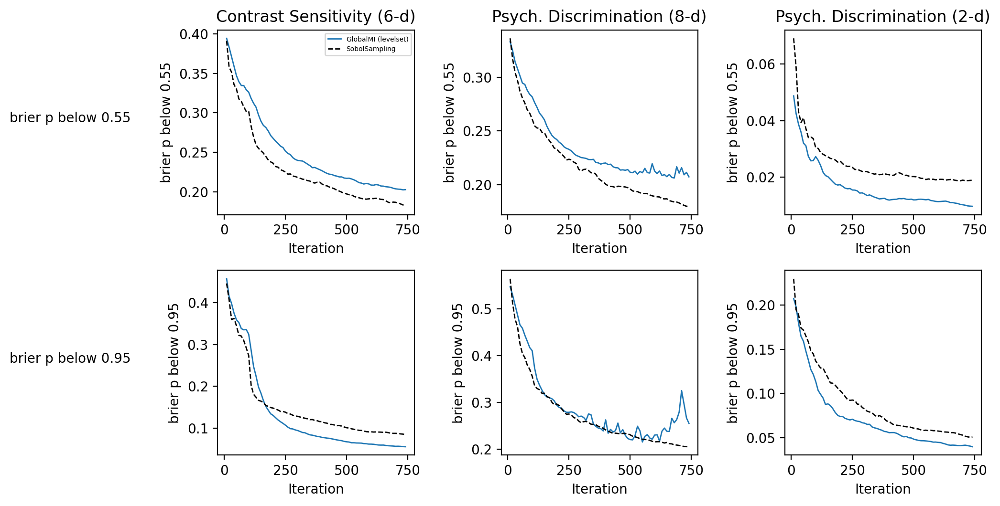

In [46]:
problem_order=np.unique(data.problem_name)
# problem_subset1 = problem_order[:3]
problem_subset2 = problem_order[3:5]
def title_map(title):
    if "remote_haptics" in title:
        return " ".join(title.split("_"))
    else:
        title_dict={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
                   "hartmann6_binary": "Binarized Hartmann6 (6-d)",
                   "discrim_lowdim": "Psych. Discrimination (2-d)",
                   "discrim_highdim": "Psych. Discrimination (8-d)"}
        return title_dict[title]

# prob_range = np.linspace(0.55, 0.95, n_rows)
prob_range = [0.55, 0.95]
n_rows = len(prob_range)
# prob_range = np.round(np.linspace(0.1, 0.9, 5), 2)
col_names = [f"brier_p_below_{prob}" for prob in prob_range]
print(col_names)

fig,ax=plt.subplots(n_rows, len(problem_subset1), figsize=(3.5*len(problem_subset1),2.7*n_rows),dpi=200)
for i_row, col_name in enumerate(col_names):
    data_subset=data[~np.isnan(data[col_name])]
    print(len(data_subset))
    s = (data_subset.groupby("rep").trial_id.min() == 10)
    valid_reps = s[s].index
    data_subset=data_subset[data_subset.rep.isin(valid_reps)]
    print(len(data_subset))
    for i_problem, problem in enumerate(problem_subset1):
        problem_df=data_subset[["method", "trial_id_reindex", "problem_name", col_name]]
        problem_df=problem_df.groupby(["method", "problem_name", "trial_id_reindex"]).mean().reset_index()
        problem_df=problem_df[(problem_df.problem_name==problem)]
        if i_row == 0:
            ax[i_row,i_problem].set_title(" ".join(title_map(problem).split("_")))
        for i_method, method in enumerate(np.unique(data.method)):
            df=problem_df[(problem_df.method==method)]
            linestyle="dashed" if method in ["SobolSampling", "MCPosteriorVariance", "BernoulliMCMutualInformation"] else "solid"
            # color="black" if method == "SobolSampling" else f"C{i_method}"
            color=color_map(method, i_method)
            ax[i_row, i_problem].plot(df.trial_id_reindex, df[col_name], label=method, color=color
                               , linestyle=linestyle, linewidth=1)
            ax[i_row, i_problem].set_xticks(np.linspace(0,750,4).astype(int))
            ax[i_row, i_problem].set_xticklabels(np.linspace(0,750,4).astype(int))
            
            if i_problem==0 and i_row ==0:
                ax[i_row,i_problem].legend(loc="upper right",fontsize=5)
            ax[i_row,i_problem].set_ylabel(" ".join(col_name.split("_")))
            ax[i_row,i_problem].set_xlabel("Iteration")
        if i_problem == 0:
            ax[i_row, i_problem].annotate(" ".join(col_name.split("_")), xy=(-0.75, 0.5), xycoords="axes fraction", 
                                          ha="center", va="baseline", fontsize=10)
    plt.tight_layout()
# fig.savefig("figures/brier_p_below_problem_subset1_levelset.png", bbox_inches="tight")

In [46]:
n_rows = 5
prob_range = np.linspace(0.55, 0.95, n_rows)
# prob_range = np.round(np.linspace(0.1, 0.9, 5), 2)
col_names = [f"brier_p_below_{prob}" for prob in prob_range]
print(col_names)

fig,ax=plt.subplots(n_rows, len(problem_subset2), figsize=(3*len(problem_subset2),2.7*n_rows),dpi=200)
for i_row, col_name in enumerate(col_names):
    for i_problem, problem in enumerate(problem_subset2):
        problem_df=data[["method", "trial_id_reindex", "problem_name", col_name]]
        problem_df=problem_df.groupby(["method", "problem_name", "trial_id_reindex"]).mean().reset_index()
        problem_df=problem_df[(problem_df.problem_name==problem)]
        if i_row == 0:
            ax[i_row,i_problem].set_title(" ".join(title_map(problem).split("_")))
        for i_method, method in enumerate(np.unique(data.method)):
            df=problem_df[(problem_df.method==method)]
            # if "50_init_trials" in method:
            #     df.loc[:,"trial_id_reindex"] = df.trial_id_reindex+40
            #     df=df[df.trial_id_reindex<=740]
            # color="black" if method=="SobolSampling" else f"C{i_method}"
            linestyle="dashed" if method in ["SobolSampling", "MCPosteriorVariance", "BernoulliMCMutualInformation"] else "solid"
            # color="black" if method == "SobolSampling" else f"C{i_method}"
            color=color_map(method, i_method)
            ax[i_row, i_problem].plot(df.trial_id_reindex, df[col_name], label=method, color=color
                               , linestyle=linestyle, linewidth=1)
            ax[i_row, i_problem].set_xticks(np.linspace(0,750,4).astype(int))
            ax[i_row, i_problem].set_xticklabels(np.linspace(0,750,4).astype(int))
            
            if i_problem==0 and i_row ==0:
                ax[i_row,i_problem].legend(loc="upper right",fontsize=5)
            ax[i_row,i_problem].set_ylabel(" ".join(col_name.split("_")))
            ax[i_row,i_problem].set_xlabel("Iteration")
        if i_problem == 0:
            ax[i_row, i_problem].annotate(" ".join(col_name.split("_")), xy=(-0.9, 0.5), xycoords="axes fraction", 
                                          ha="center", va="baseline", fontsize=15)
    plt.tight_layout()

array([0.1, 0.3, 0.5, 0.7, 0.9])

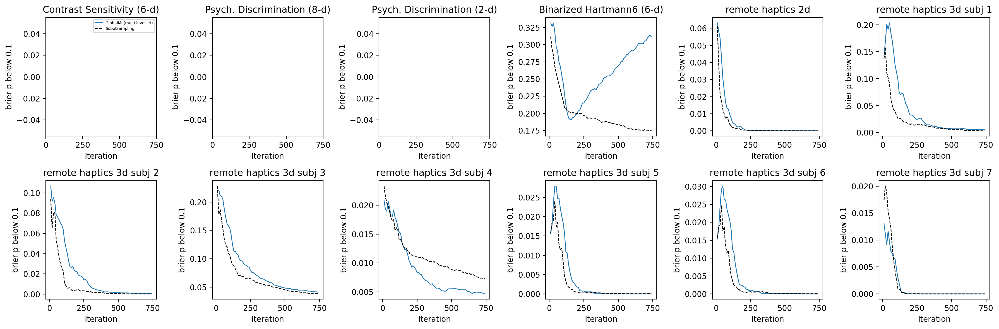

In [25]:
col_name = 'brier_p_below_0.1'


n_cols=len(problem_order)//2
fig,ax=plt.subplots(2, n_cols, figsize=(18,6),dpi=200)
for i_problem, problem in enumerate(problem_order):
    # if "brier_p_below" in col_name:
    #     col_name="brier_p_below_0.75" if i_problem <= 2 else "brier_p_below_0.5"
    problem_df=data[["method", "trial_id_reindex", "problem_name", col_name]]
    problem_df=problem_df.groupby(["method", "problem_name", "trial_id_reindex"]).mean().reset_index()
    problem_df=problem_df[(problem_df.problem_name==problem)]
    for i_method, method in enumerate(np.unique(data.method)):
        df=problem_df[(problem_df.method==method)]
        # if "50_init_trials" in method:
        #     df.loc[:,"trial_id_reindex"] = df.trial_id_reindex+40
        #     df=df[df.trial_id_reindex<=740]
        # color="black" if method=="SobolSampling" else f"C{i_method}"
        linestyle="dashed" if method in ["SobolSampling", "MCPosteriorVariance", "BernoulliMCMutualInformation"] else "solid"
        # color="black" if method == "SobolSampling" else f"C{i_method}"
        color=color_map(method, i_method)
        ax[i_problem//n_cols, i_problem%n_cols].plot(df.trial_id_reindex, df[col_name], label=method, color=color
                           , linestyle=linestyle, linewidth=1)
        ax[i_problem//n_cols, i_problem%n_cols].set_xticks(np.linspace(0,750,4).astype(int))
        ax[i_problem//n_cols, i_problem%n_cols].set_xticklabels(np.linspace(0,750,4).astype(int))
        ax[i_problem//n_cols, i_problem%n_cols].set_title(" ".join(title_map(problem).split("_")))
        if i_problem==0:
            ax[i_problem//n_cols, i_problem%n_cols].legend(loc="upper right",fontsize=5)
        ax[i_problem//n_cols, i_problem%n_cols].set_ylabel(" ".join(col_name.split("_")))
        ax[i_problem//n_cols, i_problem%n_cols].set_xlabel("Iteration")
plt.tight_layout()
# fig.savefig("figures/brier_p_below_multi_levelset.png", bbox_inches="tight")

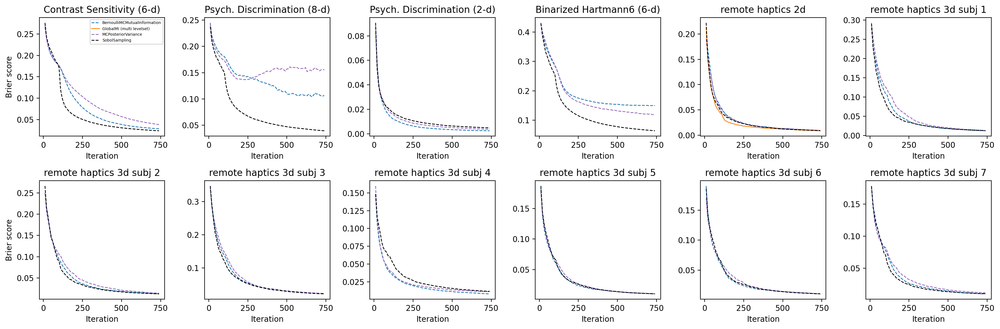

In [75]:
problem_order=np.unique(data.problem_name)
def title_map(title):
    if "remote_haptics" in title:
        return " ".join(title.split("_"))
    else:
        title_dict={"contrast_sensitivity_6d": "Contrast Sensitivity (6-d)",
                   "hartmann6_binary": "Binarized Hartmann6 (6-d)",
                   "discrim_lowdim": "Psych. Discrimination (2-d)",
                   "discrim_highdim": "Psych. Discrimination (8-d)"}
        return title_dict[title]

n_cols=len(problem_order)//2
fig,ax=plt.subplots(2, n_cols, figsize=(18,6),dpi=200)
for i_problem, problem in enumerate(problem_order):
    problem_df=data[["method", "trial_id_reindex", "problem_name", 'expected_brier']]
    problem_df=problem_df.groupby(["method", "problem_name", "trial_id_reindex"]).mean().reset_index()
    problem_df=problem_df[(problem_df.problem_name==problem)]
    for i_method, method in enumerate(np.unique(data.method)):
        df=problem_df[(problem_df.method==method)]
        # if "50_init_trials" in method:
        #     df.loc[:,"trial_id_reindex"] = df.trial_id_reindex+40
        #     df=df[df.trial_id_reindex<=740]
        # color="black" if method=="SobolSampling" else f"C{i_method}"
        linestyle="dashed" if method in ["SobolSampling", "MCPosteriorVariance", "BernoulliMCMutualInformation"] else "solid"
        # color="black" if method == "SobolSampling" else f"C{i_method}"
        color=color_map(method, i_method)
        ax[i_problem//n_cols, i_problem%n_cols].plot(df.trial_id_reindex, df.expected_brier, label=method, color=color
                           , linestyle=linestyle, linewidth=1)
        ax[i_problem//n_cols, i_problem%n_cols].set_xticks(np.linspace(0,750,4).astype(int))
        ax[i_problem//n_cols, i_problem%n_cols].set_xticklabels(np.linspace(0,750,4).astype(int))
        ax[i_problem//n_cols, i_problem%n_cols].set_title(" ".join(title_map(problem).split("_")))
        if i_problem==0:
            ax[i_problem//n_cols, i_problem%n_cols].legend(loc="upper right",fontsize=5)
        if i_problem%n_cols==0:
            ax[i_problem//n_cols, i_problem%n_cols].set_ylabel("Brier score")
        ax[i_problem//n_cols, i_problem%n_cols].set_xlabel("Iteration")
plt.tight_layout()
# fig.savefig("figures/expected_brier_multi_levelset_thompson_sampler_kds.png", bbox_inches="tight")

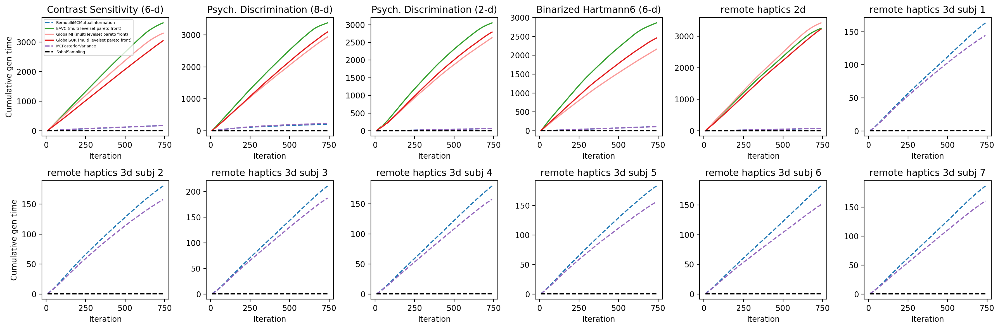

In [9]:
runtime_data=data[["method", "trial_id_reindex", "problem_name", "cum_gen_time"]]
runtime_data=runtime_data.groupby(["method", "problem_name", "trial_id_reindex"]).mean().reset_index()
problems=np.unique(runtime_data.problem_name)
n_cols=len(problem_order)//2
fig,ax=plt.subplots(2, n_cols, figsize=(18,6),dpi=200)

for i_problem, problem in enumerate(problem_order):
    for i_method, method in enumerate(np.unique(runtime_data.method)):
        df = runtime_data[(runtime_data.method==method) & (runtime_data.problem_name==problem)]
        color="black" if method == "SobolSampling" else f"C{i_method}"
        if "50_init_trials" in method:
            df.loc[:,"trial_id_reindex"] = df.trial_id_reindex+40
            df=df[df.trial_id_reindex<=740]
        # color="black" if method=="SobolSampling" else f"C{i_method}"
        color=color_map(method, i_method)
        linestyle="dashed" if method in ["SobolSampling", "BernoulliMCMutualInformation", "MCPosteriorVariance"] else "solid"
        ax[i_problem//n_cols, i_problem%n_cols].plot(df.trial_id_reindex, df.cum_gen_time, label=method, color=color, linestyle=linestyle)
        ax[i_problem//n_cols, i_problem%n_cols].set_xticks(np.linspace(0,750,4).astype(int))
        ax[i_problem//n_cols, i_problem%n_cols].set_xticklabels(np.linspace(0,750,4).astype(int))
        ax[i_problem//n_cols, i_problem%n_cols].set_title(title_map(problem))
        if i_problem==0:
            ax[i_problem//n_cols, i_problem%n_cols].legend(loc="upper left",fontsize=5)
        if i_problem%n_cols==0:
            ax[i_problem//n_cols, i_problem%n_cols].set_ylabel("Cumulative gen time")
        ax[i_problem//n_cols, i_problem%n_cols].set_xlabel("Iteration")
plt.tight_layout()
# fig.savefig("figures/cumulative_runtime_multi_levelset_summary.png", bbox_inches="tight")